In [10]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [11]:
df = pd.read_csv("Cleaned_data.csv", encoding = "ISO-8859-1")

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35295 entries, 0 to 35294
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   BorrState              35295 non-null  object 
 1   GrossApproval          35295 non-null  int64  
 2   SBAGuaranteedApproval  35295 non-null  float64
 3   ApprovalFiscalYear     35295 non-null  int64  
 4   loan_type              35295 non-null  object 
 5   InitialInterestRate    35295 non-null  float64
 6   TermInMonths           35295 non-null  int64  
 7   industry               35295 non-null  object 
 8   ProjectState           35295 non-null  object 
 9   BusinessType           35295 non-null  object 
 10  BusinessAge            35295 non-null  int64  
 11  LoanStatus             35295 non-null  object 
 12  GrossChargeOffAmount   35295 non-null  int64  
 13  RevolverStatus         35295 non-null  int64  
 14  Franchise              35295 non-null  int64  
dtypes:

In [13]:
df.LoanStatus.value_counts()

LoanStatus
PIF       31924
CHGOFF     3371
Name: count, dtype: int64

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35295 entries, 0 to 35294
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   BorrState              35295 non-null  object 
 1   GrossApproval          35295 non-null  int64  
 2   SBAGuaranteedApproval  35295 non-null  float64
 3   ApprovalFiscalYear     35295 non-null  int64  
 4   loan_type              35295 non-null  object 
 5   InitialInterestRate    35295 non-null  float64
 6   TermInMonths           35295 non-null  int64  
 7   industry               35295 non-null  object 
 8   ProjectState           35295 non-null  object 
 9   BusinessType           35295 non-null  object 
 10  BusinessAge            35295 non-null  int64  
 11  LoanStatus             35295 non-null  object 
 12  GrossChargeOffAmount   35295 non-null  int64  
 13  RevolverStatus         35295 non-null  int64  
 14  Franchise              35295 non-null  int64  
dtypes:

# EDA

# Summary Statistics:

In [15]:
# Summary statistics for numerical columns
df.describe().T

,count,mean,std,min,25%,50%,75%,max
GrossApproval,35295.0,368143.890069,710637.180682,2000.0,50000.0,115000.00,349650.0,5000000.0
SBAGuaranteedApproval,35295.0,268805.535091,543191.870861,1000.0,25000.0,75000.00,232500.0,4500000.0
ApprovalFiscalYear,35295.0,2018.348406,0.476472,2018.0,2018.0,2018.00,2019.0,2019.0
InitialInterestRate,35295.0,7.397152,1.565764,1.0,6.4,7.25,8.0,13.5
TermInMonths,35295.0,115.835472,73.168987,0.0,66.0,119.00,120.0,324.0
BusinessAge,35295.0,1.864173,1.386421,0.0,2.0,2.00,2.0,5.0
GrossChargeOffAmount,35295.0,12016.478000,70313.734307,0.0,0.0,0.00,0.0,4491269.0
RevolverStatus,35295.0,0.309562,0.462320,0.0,0.0,0.00,1.0,1.0
Franchise,35295.0,0.115115,0.319166,0.0,0.0,0.00,0.0,1.0


# BorrState

In [16]:
df["BorrState"].replace("GU","Guam", inplace = True)
df["BorrState"].replace("VI","Virgin Islands",inplace = True)


In [17]:
df['BorrState'].unique()


array(['Ohio', 'Idaho', 'Michigan', 'New Jersey', 'Washington',
       'California', 'Arizona', 'Pennsylvania', 'District of Columbia',
       'North Carolina', 'Minnesota', 'Massachusetts', 'Utah', 'New York',
       'Texas', 'Missouri', 'Florida', 'Louisiana', 'Iowa', 'Delaware',
       'South Dakota', 'Oregon', 'Wisconsin', 'Rhode Island', 'Montana',
       'Illinois', 'Tennessee', 'New Mexico', 'Alaska', 'Nebraska',
       'Colorado', 'Maryland', 'Oklahoma', 'South Carolina', 'Kentucky',
       'Indiana', 'Maine', 'Georgia', 'PR', 'Kansas', 'Virginia',
       'Nevada', 'Mississippi', 'New Hampshire', 'Connecticut', 'Alabama',
       'Hawaii', 'Vermont', 'Arkansas', 'North Dakota', 'Wyoming', 'Guam',
       'West Virginia', 'Virgin Islands'], dtype=object)

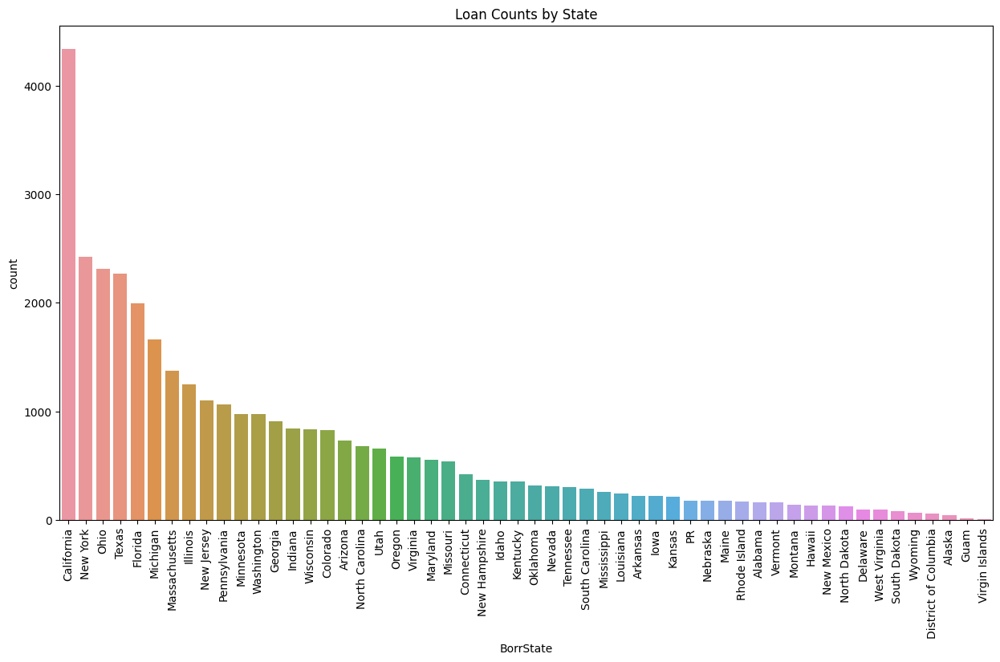

In [18]:


# Countplot of loan counts by state
plt.figure(figsize=(15, 8))
sns.countplot(x='BorrState', data=df, order=df['BorrState'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Loan Counts by State')
plt.show()




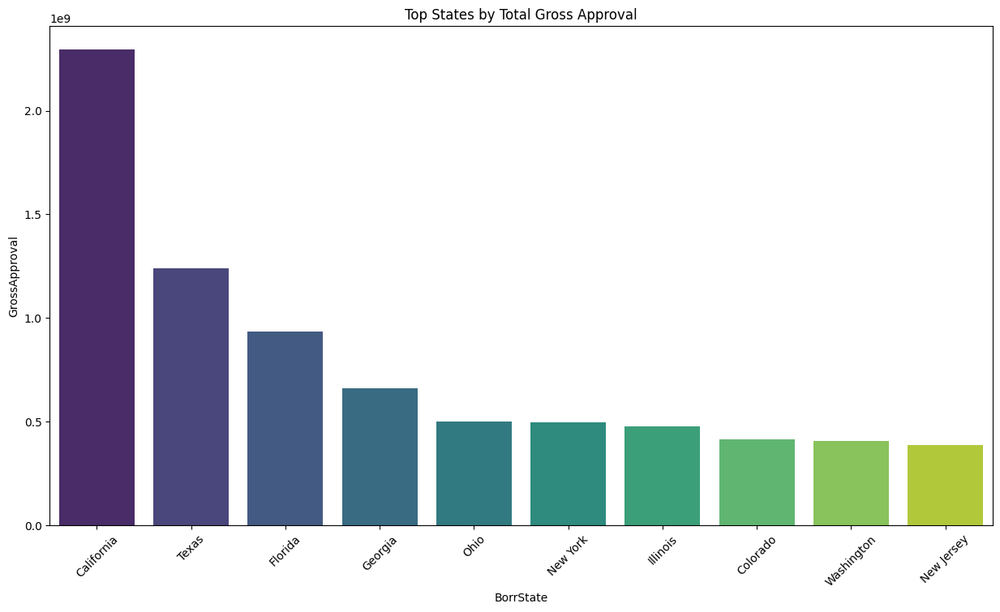

In [19]:

# Calculate total GrossApproval by state
total_gross_approval_by_state = df.groupby('BorrState')['GrossApproval'].sum().sort_values(ascending=False).reset_index()

# Select the top N states (change N to the desired number)
top_states = total_gross_approval_by_state.head(10)

custom_colors = sns.color_palette("viridis", n_colors=len(top_states))


# Bar plot for top states by total GrossApproval
plt.figure(figsize=(15, 8))
sns.barplot(x='BorrState', y='GrossApproval', data=top_states,palette=custom_colors)
plt.xticks(rotation=45)
plt.title('Top States by Total Gross Approval')
plt.show()


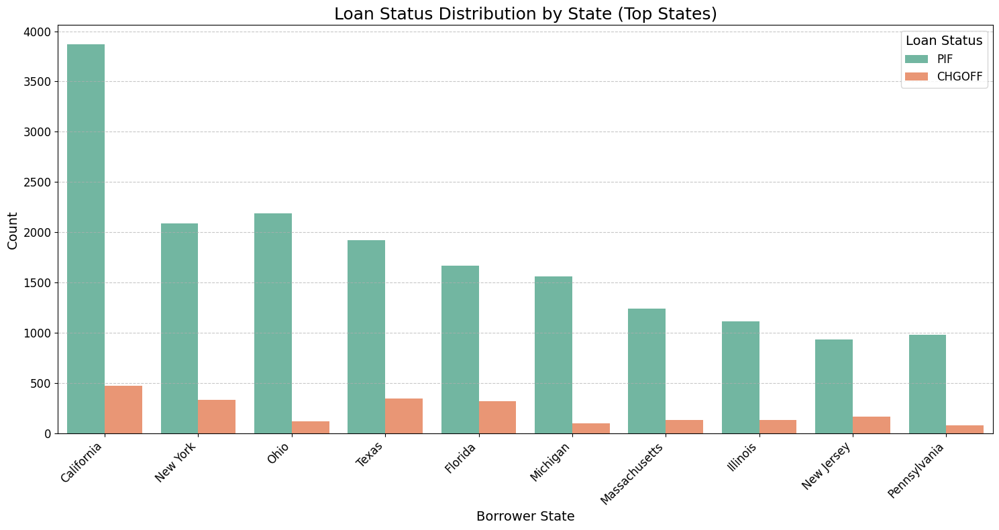

In [20]:
# Get the top 10 states by loan count
top_states = df['BorrState'].value_counts().head(10).index

# Filter the dataframe for only the top states
df_top_states = df[df['BorrState'].isin(top_states)]

# Define a custom color palette
custom_palette = sns.color_palette("Set2")

# Countplot of LoanStatus by BorrState for top states with improved aesthetics
plt.figure(figsize=(15, 8))
sns.countplot(x='BorrState', hue='LoanStatus', data=df_top_states, order=top_states, palette=custom_palette)

# Improve aesthetics
plt.title('Loan Status Distribution by State (Top States)', fontsize=18)
plt.xlabel('Borrower State', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Loan Status', title_fontsize='14', fontsize='12', loc='upper right')

# Adding a grid for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()


# GrossApproval , SBAGuaranteedApproval and ApprovalFiscalYear

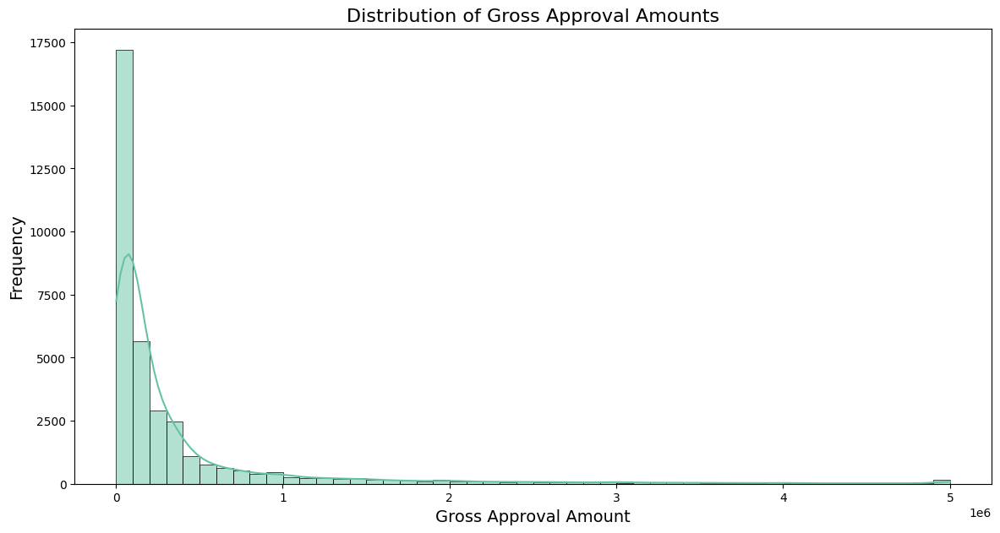

In [21]:
# Set a different color palette
sns.set_palette("Set2")

# Initialize the figure
plt.figure(figsize=(14, 7))

# Plot distribution of GrossApproval with improved aesthetics
sns.histplot(df['GrossApproval'], bins=50, kde=True, edgecolor='black', linewidth=0.5)

# Add title and labels
plt.title('Distribution of Gross Approval Amounts', fontsize=16)
plt.xlabel('Gross Approval Amount', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# Show the plot
plt.show()


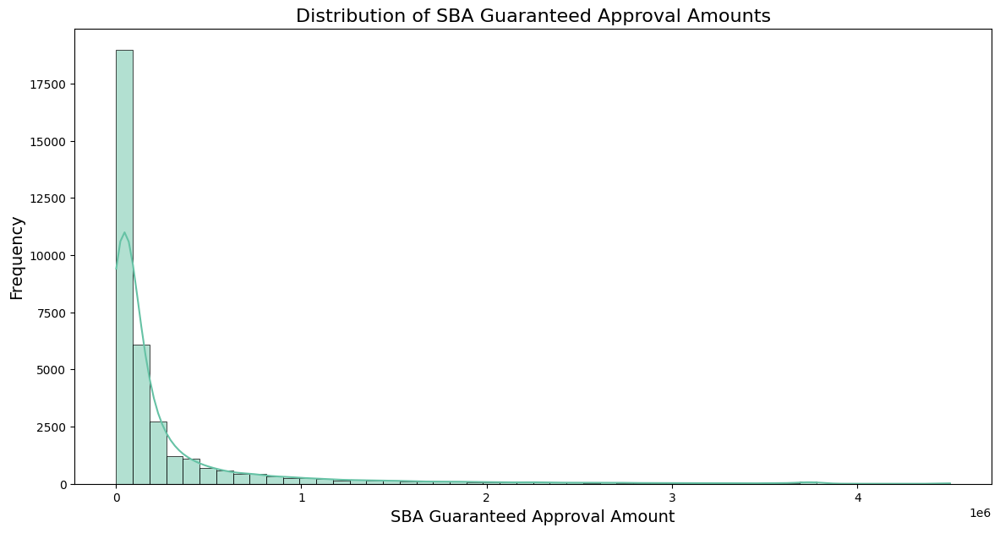

In [22]:
# Set a different color palette
sns.set_palette("Set2")

# Initialize the figure
plt.figure(figsize=(14, 7))

# Plot distribution of SBAGuaranteedApproval with improved aesthetics
sns.histplot(df['SBAGuaranteedApproval'], bins=50, kde=True, edgecolor='black', linewidth=0.5)

# Add title and labels
plt.title('Distribution of SBA Guaranteed Approval Amounts', fontsize=16)
plt.xlabel('SBA Guaranteed Approval Amount', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# Show the plot
plt.show()


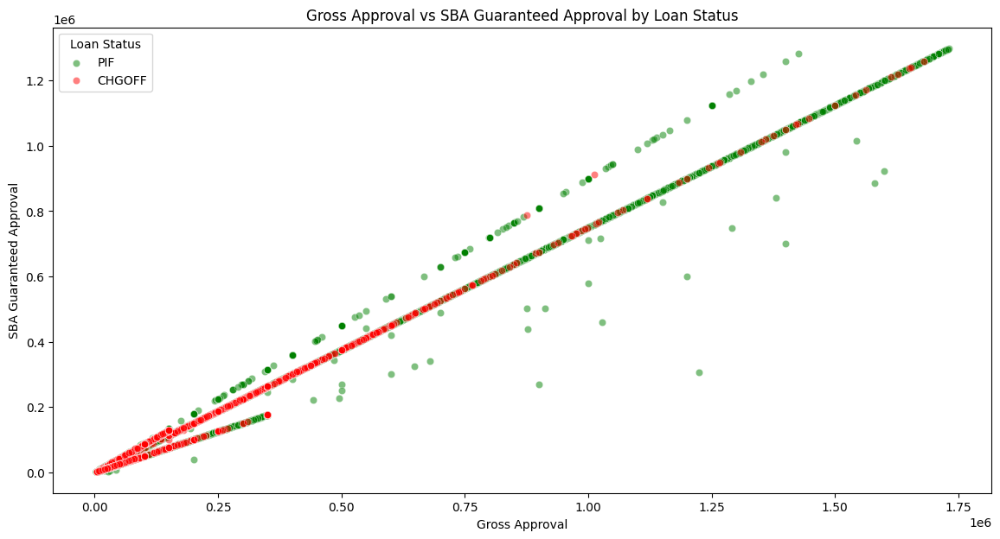

In [23]:
# Adjusting the plot to make CHGOFF points visible over PIF points
plt.figure(figsize=(14, 7))
# Filter out extreme outliers for better visualization
filtered_df = df[(df['GrossApproval'] < df['GrossApproval'].quantile(0.95)) &
                (df['SBAGuaranteedApproval'] < df['SBAGuaranteedApproval'].quantile(0.95))]

# Separate the data by LoanStatus
pif_data = filtered_df[filtered_df['LoanStatus'] == 'PIF']
chgoff_data = filtered_df[filtered_df['LoanStatus'] == 'CHGOFF']

# Plot PIF points
sns.scatterplot(data=pif_data, x='GrossApproval', y='SBAGuaranteedApproval', color='green', label='PIF', alpha=0.5)
# Plot CHGOFF points on top
sns.scatterplot(data=chgoff_data, x='GrossApproval', y='SBAGuaranteedApproval', color='red', label='CHGOFF', alpha=0.5)

plt.title('Gross Approval vs SBA Guaranteed Approval by Loan Status')
plt.xlabel('Gross Approval')
plt.ylabel('SBA Guaranteed Approval')
plt.legend(title='Loan Status')
plt.show()

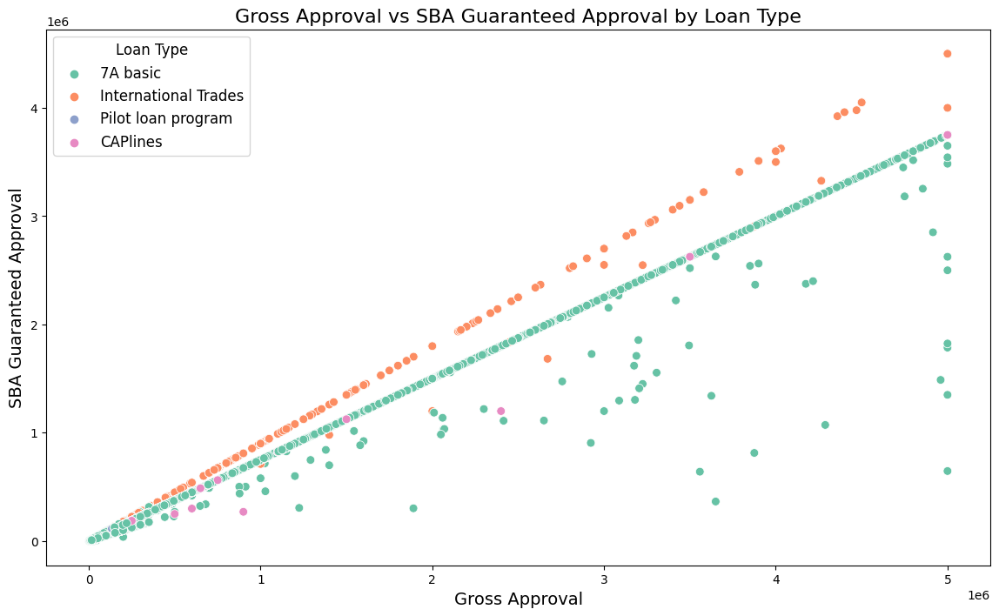

In [24]:
# Set a color palette
sns.set_palette("Set2")

# Initialize the figure
plt.figure(figsize=(14, 8))

# Scatter plot of GrossApproval vs SBAGuaranteedApproval with different colors for each loan type
sns.scatterplot(x='GrossApproval', y='SBAGuaranteedApproval', hue='loan_type', data=df, palette='Set2', s=50)

# Add title and labels
plt.title('Gross Approval vs SBA Guaranteed Approval by Loan Type', fontsize=16)
plt.xlabel('Gross Approval', fontsize=14)
plt.ylabel('SBA Guaranteed Approval', fontsize=14)

# Show the plot
plt.legend(title='Loan Type', title_fontsize='12', fontsize='12', loc='upper left')
plt.show()


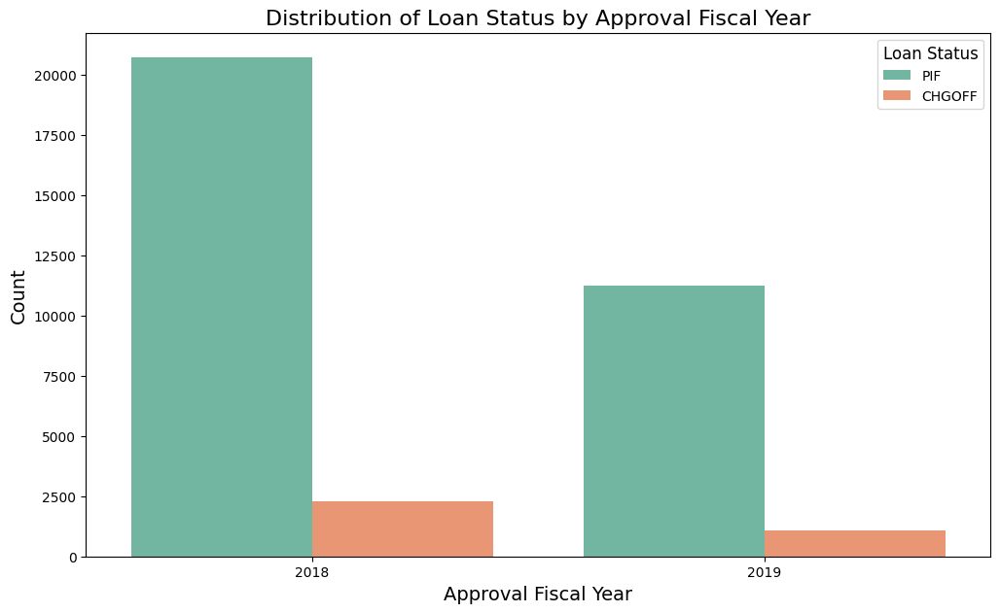

In [25]:
# Set a different color palette
sns.set_palette("pastel")

# Initialize the figure
plt.figure(figsize=(12, 7))

# Countplot of ApprovalFiscalYear by LoanStatus
sns.countplot(x='ApprovalFiscalYear', hue='LoanStatus', data=df, palette="Set2")

# Add title and labels
plt.title('Distribution of Loan Status by Approval Fiscal Year', fontsize=16)
plt.xlabel('Approval Fiscal Year', fontsize=14)
plt.ylabel('Count', fontsize=14)

# Add legend for LoanStatus
plt.legend(title='Loan Status', title_fontsize='12', fontsize='10', loc='upper right')

# Show the plot
plt.show()


#  InitialInterestRate  and TermInMonths

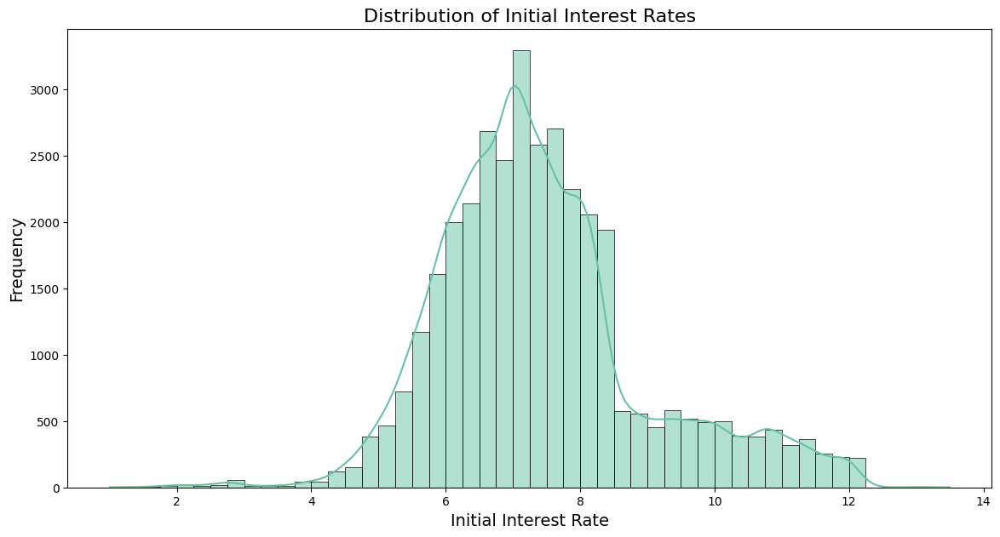

In [26]:
# Set a different color palette
sns.set_palette("Set2")

# Initialize the figure
plt.figure(figsize=(14, 7))

# Plot distribution of InitialInterestRate with improved aesthetics
sns.histplot(df['InitialInterestRate'], bins=50, kde=True, edgecolor='black', linewidth=0.5)

# Add title and labels
plt.title('Distribution of Initial Interest Rates', fontsize=16)
plt.xlabel('Initial Interest Rate', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# Show the plot
plt.show()


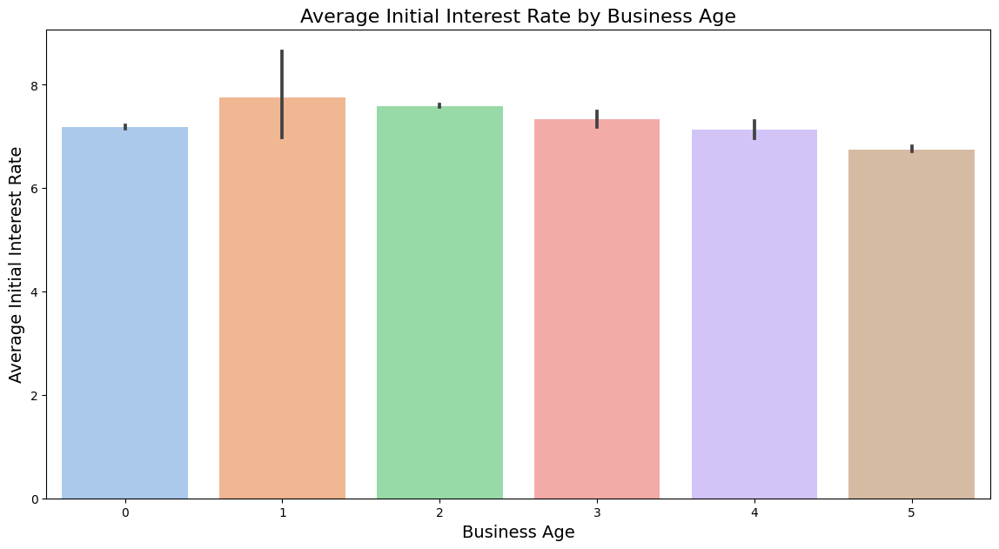

In [27]:
# Set a different color palette
sns.set_palette("pastel")

# Initialize the figure
plt.figure(figsize=(14, 7))

# Bar plot for average InitialInterestRate by BusinessAge
sns.barplot(x='BusinessAge', y='InitialInterestRate', data=df)

# Add title and labels
plt.title('Average Initial Interest Rate by Business Age', fontsize=16)
plt.xlabel('Business Age', fontsize=14)
plt.ylabel('Average Initial Interest Rate', fontsize=14)

# Show the plot
plt.show()


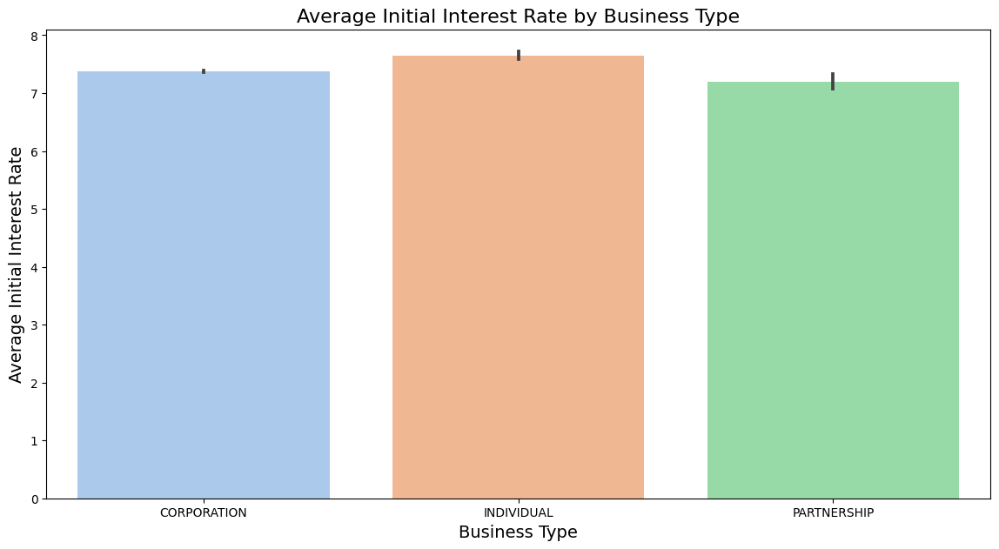

In [28]:
# Set a different color palette
sns.set_palette("pastel")

# Initialize the figure
plt.figure(figsize=(14, 7))

# Bar plot for average InitialInterestRate by BusinessType
sns.barplot(x='BusinessType', y='InitialInterestRate', data=df)

# Add title and labels
plt.title('Average Initial Interest Rate by Business Type', fontsize=16)
plt.xlabel('Business Type', fontsize=14)
plt.ylabel('Average Initial Interest Rate', fontsize=14)

# Show the plot
plt.show()


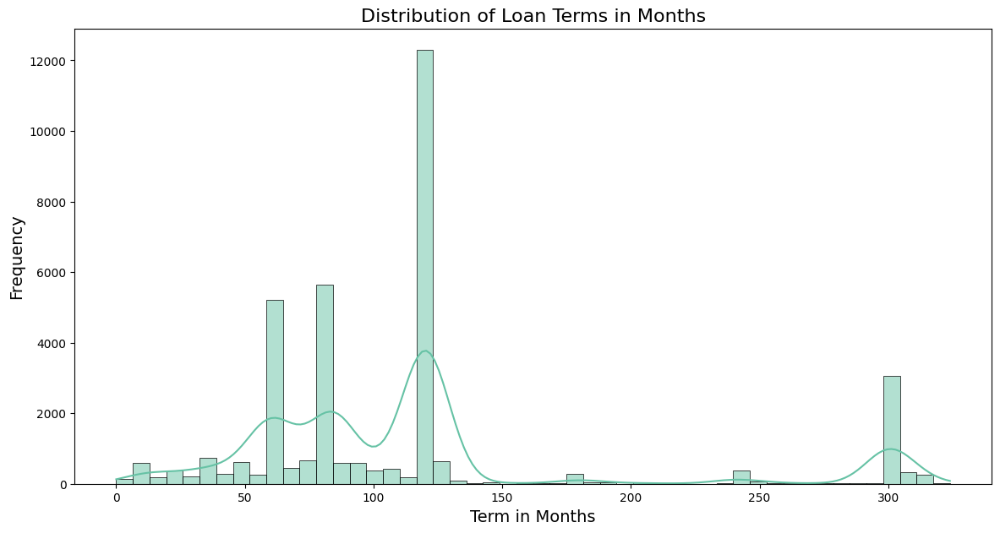

In [29]:
# Set a different color palette
sns.set_palette("Set2")

# Initialize the figure
plt.figure(figsize=(14, 7))

# Plot distribution of TermInMonths with improved aesthetics
sns.histplot(df['TermInMonths'], bins=50, kde=True, edgecolor='black', linewidth=0.5)

# Add title and labels
plt.title('Distribution of Loan Terms in Months', fontsize=16)
plt.xlabel('Term in Months', fontsize=14)
plt.ylabel('Frequency', fontsize=14)



# Show the plot
plt.show()


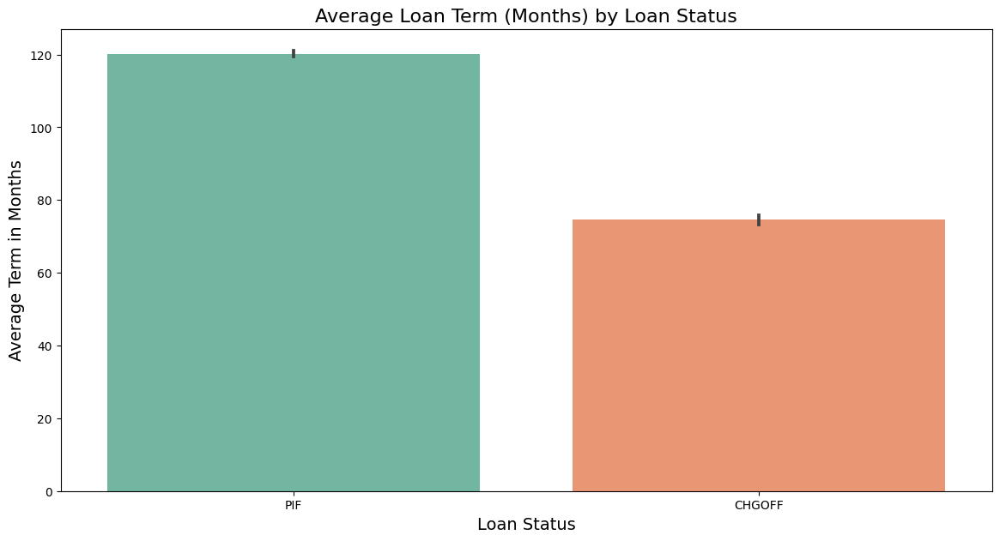

In [30]:
# Set a different color palette
sns.set_palette("Set2")

# Initialize the figure
plt.figure(figsize=(14, 7))

# Bar plot for average TermInMonths by LoanStatus
sns.barplot(x='LoanStatus', y='TermInMonths', data=df)

# Add title and labels
plt.title('Average Loan Term (Months) by Loan Status', fontsize=16)
plt.xlabel('Loan Status', fontsize=14)
plt.ylabel('Average Term in Months', fontsize=14)

# Show the plot
plt.show()


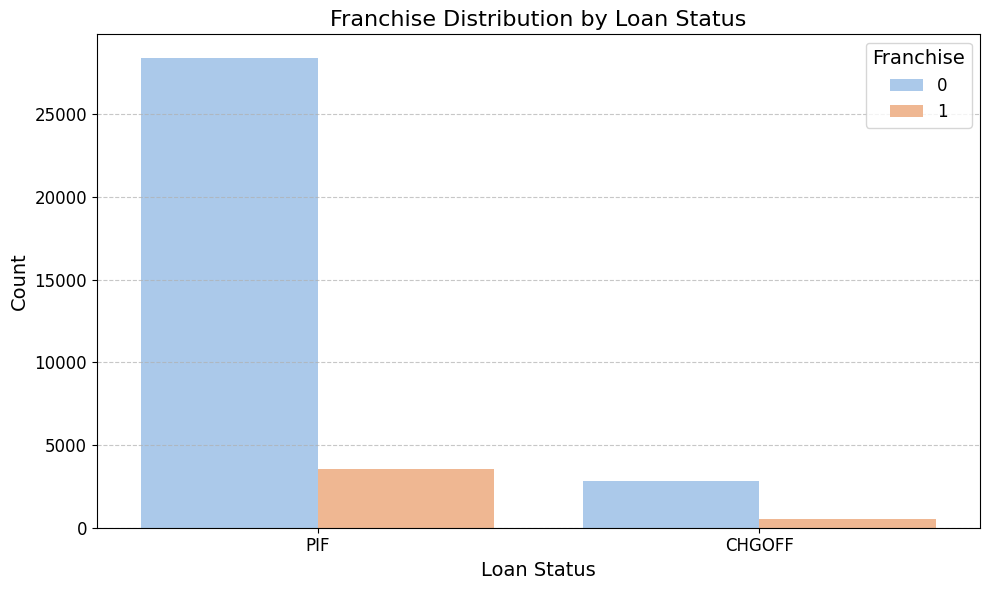

In [31]:
# Set a different color palette
sns.set_palette("pastel")

# Initialize the figure
plt.figure(figsize=(10, 6))

# Bar plot for Franchise distribution by LoanStatus
sns.countplot(x='LoanStatus', hue='Franchise', data=df)

# Add title and labels
plt.title('Franchise Distribution by Loan Status', fontsize=16)
plt.xlabel('Loan Status', fontsize=14)
plt.ylabel('Count', fontsize=14)

# Improve aesthetics
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Franchise', title_fontsize='14', fontsize='12', loc='upper right')

# Adding a grid for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()
